# "Affordable Housing Dynamics and Drug Crime: A Philadelphia Perspective"

## Introduction: <span style="font-size: 16px; color: red;">Need to broaden introductiion to all socioeconomic factors when finalized...</span>

### Overall aim:
##### <mark>This study aims to explore, visualize, and analyze...</mark> 
- will include overview of all targeted Urban Development, Planning, and Social Policy
- will icnlude overviewe and literature review of crime data under study (specifically: Philadelphia Narcotic Violation)


<span style="font-size: 36px; color: blue;">Philadelphia Affordable Housing Production & Narcotic Violation Analysis</span>

### Affordable Housing Production:
It has been shown that various aspects of the housing environment, such as neighborhood socioeconomic status, the availability of affordable housing, and exposure to crime and violence, can significantly influence drug-related challenges. Disadvantaged neighborhoods with limited access to affordable housing tend to exhibit higher rates of drug availability, trafficking, and substance abuse. Decisions regarding housing policies and urban development initiatives play a crucial role in shaping the availability of affordable housing, housing stability, and overall neighborhood conditions, all of which can impact drug and narcotics-related crime. Policies focused on expanding affordable housing options, enhancing housing quality, and revitalizing communities may indirectly contribute to addressing drug-related outcomes.

A significant portion of Philadelphia's population faces challenges in securing affordable housing, with nearly 49% of its households allocating at least 30% of their income towards housing costs, meeting the criteria as "cost burdened" by the U.S. Census Bureau. Despite Philadelphia's relatively lower cost of living compared to other major Northeastern cities, approximately one-fourth of its residents live below the poverty line. A large portion of renters experiencing cost burdens reside in the Western and Northern regions of the city (Philadelphia Research and Policy). 

This study focuses on analyzing datasets sourced from Philadelphia, PA, over a ten-year period, specifically examining data on Affordable Housing Production from the Division of Housing and Community Development (DHCD), available through OpenDataPhilly, covering the years 2008 to 2018. The affordable housing data comes from the DHCD, which provides financial support to developers involved in the construction or renovation of affordable housing. These units are made available for sale, rent, and to accommodate individuals with special needs, highlighting the DHCD's critical role in addressing housing challenges in the city. This data will be cross-analyzed with Philadelphia crime data to explore potential correlations between housing development and crime trends. Understanding the relationship between affordable housing production and crime rates is important, as it may offer valuable insights into how housing policies and development initiatives impact crime levels, providing useful information for policymakers and urban planners.

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import geopandas as gpd
import geodatasets
import seaborn as sns
import mplcursors
from shapely.geometry import Point
import folium
from folium.plugins import HeatMap, MarkerCluster
import contextily as ctx
import plotly.express as px
import plotly.graph_objects as go
import re
import ssl
import certifi
import geopy.geocoders
from geopy.geocoders import Nominatim

### Importing Philadelphia Crime Data

In [2]:
philcrime23 = pd.read_csv("2023PhilCrime.csv")
philcrime22 = pd.read_csv("2022PhilCrime.csv")
philcrime21 = pd.read_csv("2021PhilCrime.csv")
philcrime20 = pd.read_csv("2020PhilCrime.csv")
philcrime19 = pd.read_csv("2019PhilCrime.csv")
philcrime18 = pd.read_csv("2018PhilCrime.csv")
philcrime17 = pd.read_csv("2017PhilCrime.csv")
philcrime16 = pd.read_csv("2016PhilCrime.csv")
philcrime15 = pd.read_csv("2015PhilCrime.csv")
philcrime14 = pd.read_csv("2014PhilCrime.csv")
philcrime13 = pd.read_csv("2013PhilCrime.csv")
philcrime12 = pd.read_csv("2012PhilCrime.csv")
philcrime11 = pd.read_csv("2011PhilCrime.csv")
philcrime10 = pd.read_csv("2010PhilCrime.csv")
philcrime09 = pd.read_csv("2009PhilCrime.csv")
philcrime08 = pd.read_csv("2008PhilCrime.csv")
philcrime07 = pd.read_csv("2007PhilCrime.csv")

### Drug/Narcotic Crime Data Clean Up

In [3]:
def count_narcotic_drug_violations(dataset):
    subset = dataset[["location_block", "text_general_code"]]

    drug_subset = subset[
        subset["text_general_code"].str.contains("narcotic|drug", case=False)
    ]

    drug_counts = (
        drug_subset["text_general_code"].str.contains("narcotic|drug", case=False).sum()
    )

    return drug_counts

In [4]:
phil_crime_data = [
    "2007PhilCrime.csv",
    "2008PhilCrime.csv",
    "2009PhilCrime.csv",
    "2010PhilCrime.csv",
    "2011PhilCrime.csv",
    "2012PhilCrime.csv",
    "2013PhilCrime.csv",
    "2014PhilCrime.csv",
    "2015PhilCrime.csv",
    "2016PhilCrime.csv",
    "2017PhilCrime.csv",
    "2018PhilCrime.csv",
    "2019PhilCrime.csv",
    "2020PhilCrime.csv",
    "2021PhilCrime.csv",
    "2022PhilCrime.csv",
    "2023PhilCrime.csv",
]

In [7]:
drugcrime_by_year = {}
for data in phil_crime_data:

    philcrime = pd.read_csv(data)

    year = int(data[:4])
    drugcrime_count = count_narcotic_drug_violations(philcrime)
    drugcrime_by_year[year] = drugcrime_count

drugcrime_df = pd.DataFrame(
    list(drugcrime_by_year.items()), columns=["Year", "Drug Crime Count"]
)
drugcrime_df["Year"] = drugcrime_df["Year"].astype(int)

#philcrime

In [8]:
philly_pop_data = pd.read_excel("PhillyPopData_2008to2018.xlsx")
philly_pop_data["Population"] = philly_pop_data["Population"].astype(int)

In [9]:
drugcrime_filtered = drugcrime_df[
    (drugcrime_df["Year"] >= 2008) & (drugcrime_df["Year"] <= 2018)
]
crime_w_pop = pd.merge(drugcrime_filtered, philly_pop_data, on="Year", how="outer")
crime_w_pop["Crime Rate (per 100,000)"] = (
    crime_w_pop["Drug Crime Count"] / crime_w_pop["Population"]
) * 100000
#crime_w_pop

# Drug Crime Time Series (2008-2018)

In [10]:
drugcrime_df["Year"] = drugcrime_df["Year"].astype(int)
drugcrime_df_filtered = drugcrime_df[
    (drugcrime_df["Year"] >= 2008) & (drugcrime_df["Year"] <= 2018)
]

fig = go.Figure()

fig.add_trace(go.Scatter(
    x=drugcrime_df_filtered["Year"],
    y=drugcrime_df_filtered["Drug Crime Count"],
    mode='lines+markers',
    name='Drug Crime Count',
    line=dict(color='blue'),
    marker=dict(symbol='circle', size=8, color='blue'),
))

fig.update_layout(
    title="2008 to 2018 Yearly Drug Crime Count",
    xaxis_title="Year",
    yaxis_title="Drug Crime Count",
    xaxis=dict(
        tickmode="linear",
        tick0=2008,
        dtick=1,
    ),
    yaxis=dict(
        showgrid=True,
    ),
    template="plotly_white",
    font=dict(size=14),
)

fig.show()

### Methodology, Purpose, and Analysis:
The plot above illustrates the yearly count of drug-related crimes from 2008 to 2018, utilizing a time series line graph to highlight the trends over this period. This visualization effectively captures fluctuations and patterns in drug crime rates, offering a comprehensive overview of their progression over time. By presenting the data in a continuous, visually engaging format, the graph aids in identifying key trends and anomalies that can inform deeper analysis. Understanding these patterns provides valuable insights into the dynamics of drug-related crime in Philadelphia, enabling data-driven strategies and targeted interventions to address underlying issues and improve community outcomes.

<span style="font-size: 16px; color: red;">need to expand...</span>

# Affordable Housing Time Series (2008-2018)

In [11]:
housing = pd.read_csv("Affordable_Housing.csv")
yearly_totals = housing.groupby("FISCAL_YEAR_COMPLETE")["TOTAL_UNITS"].sum()
housing_yearly_totals = pd.DataFrame(yearly_totals).reset_index()
housing_yearly_totals.columns = ["FISCAL_YEAR_COMPLETE", "Units Built In Year"]
housing_yearly_totals["Year"] = housing_yearly_totals["FISCAL_YEAR_COMPLETE"].astype(
    int
)
housing_yearly_totals.drop(columns=["FISCAL_YEAR_COMPLETE"], inplace=True)

In [12]:
housing_filtered = housing_yearly_totals[
    (housing_yearly_totals["Year"] >= 2008) & (housing_yearly_totals["Year"] <= 2018)
]

housing_and_crime = pd.merge(housing_filtered, crime_w_pop, on="Year", how="outer")
housing_and_crime["Total Units Built"] = housing_and_crime[
    "Units Built In Year"
].cumsum()

In [13]:
housing_yearly_totals_filtered = housing_yearly_totals[
    (housing_yearly_totals["Year"] >= 2008) & (housing_yearly_totals["Year"] <= 2018)
]

fig = px.bar(
    housing_yearly_totals_filtered, 
    x='Units Built In Year',
    y='Year',
    orientation='h',
    color='Units Built In Year',
    color_continuous_scale='Blues',
    title="Affordable Housing Units Built By Year",
    labels={'Units Built In Year': 'Total Units', 'Year': 'Year'},
    height=600
)

fig.update_layout(
    width=1000,
    xaxis_title="Number of Units",
    yaxis_title="Year",
    template="plotly_white",
    xaxis=dict(tickmode="linear", tick0=0, dtick=500),
    yaxis=dict(tickmode="linear", tick0=2008, dtick=1),
)

fig.show()

### Methodology, Purpose, and Analysis:
This bar plot is a clear and concise overview of the total number of units built each year from 2008 to 2018. The bar plot effectively presents this information in a visually accessible format, allowing viewers to quickly grasp the annual trends in affordable housing construction activity. The use of bars makes it easy to compare the number of units built across different years, helping to identify fluctuations or patterns over the specified timeframe. Additionally, by focusing specifically on the number of units built, this visual provides valuable insight into the city's housing development trajectory.

<span style="font-size: 16px; color: red;">need to expand...</span>

# Time Series Analysis of Crime Rate and Affordable Housing Trends (2008-2018)

In [14]:
fig = px.line(housing_and_crime, x='Year', y=['Crime Rate (per 100,000)', 'Total Units Built'],
              title='Crime Rate and Units Built by Year',
              labels={'Crime Rate (per 100,000)': 'Crime Rate (per 100,000)',
                      'Cumulative Total Units Built': 'Units Built'},
              markers=True)

fig.show()

### Methodology, Purpose, and Analysis:
A time series plot was used to visualize the relationship between the total number of affordable housing units built and the crime rate per 100,000 individuals. This visualization allows for the examination of trends over time and potential associations between these variables. By plotting both data sets on the same line graph, fluctuations in housing construction and changes in the crime rate can be analyzed together. This approach helps identify patterns or correlations between housing development and crime levels. Additionally, the time series format provides valuable insights into how these variables evolve over the designated period, deepening our understanding of their relationship.

<span style="font-size: 16px; color: red;">need to expand...</span>

# Analyzing Affordable Housig by Zip Code

In [15]:
import geopandas as gpd
import geoviews as gv
import holoviews as hv
import hvplot.pandas
import pandas as pd
import panel as pn

gv.extension("bokeh")
hv.extension("bokeh")
pn.extension()

In [16]:
gdf = gpd.read_file("Affordable_Housing.geojson")
gdf["Longitude"] = gdf["geometry"].x
gdf["Latitude"] = gdf["geometry"].y

crimegdf = gpd.GeoDataFrame(philcrime, geometry=gpd.points_from_xy(philcrime['lng'], philcrime['lat']))

In [17]:
geopy.geocoders.options.default_ssl_context = ssl.create_default_context(
    cafile=certifi.where()
)
geolocator = Nominatim(user_agent="ruc_data_viz_class")

In [18]:
def get_zip(row):
    try:
        location = geolocator.reverse(f"{row['geometry'].y}, {row['geometry'].x}")
        address_string = location.address

        regex_match = re.search(r", \d{5},", address_string)
        match_string = regex_match.group()
        zip_code_with_extra_spaces = match_string.replace(",", "")
        zip_code_string = zip_code_with_extra_spaces.strip()
        zip_code_number = int(zip_code_string)

        return zip_code_number
    except:
        return None

In [19]:
def get_zip_from_coordinates(geodf):
    if "geometry" not in geodf.columns:
        return None

    geodf["ZIP_CODE"] = geodf.apply(get_zip, axis=1)

    return geodf

In [20]:
gdf = get_zip_from_coordinates(gdf)
housing_binned_data = gdf.groupby("ZIP_CODE").size().reset_index(name="housing_count")

In [21]:
## Extremely Long Run Time
# crimegdf = get_zip_from_coordinates(crimegdf)
# crimegdf_binned_data = crimegdf.groupby("ZIP_CODE").size().reset_index(name="housing_count")

In [22]:
housing_binned_data['ZIP_CODE'] = housing_binned_data['ZIP_CODE'].astype(str)

fig = px.bar(
    housing_binned_data, 
    x='ZIP_CODE', 
    y='housing_count', 
    title='Affordable Housing Count by ZIP Code', 
    labels={'housing_count': 'Number of Housing Units', 'ZIP_CODE': 'ZIP Code'},
    color='housing_count',
    color_continuous_scale='Blues',
    height=600
)

fig.update_layout(
    width=1200,
    xaxis_title="ZIP Code",
    yaxis_title="Number of Housing Units",
    xaxis=dict(tickangle=45),
    template="plotly_white",
)

fig.show()

# Binned Affordable Housing Data (By Zipcode)

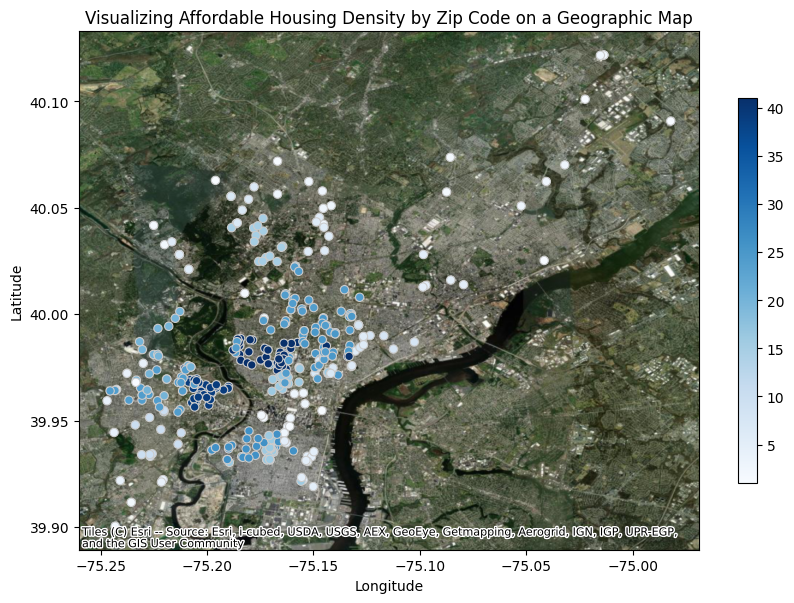

In [23]:
housing_binned_data = gdf.groupby("ZIP_CODE").size().reset_index(name="housing_count")

gdf_with_zip = gdf.merge(housing_binned_data, on="ZIP_CODE", how="left")

fig, ax = plt.subplots(figsize=(10, 10))
gdf_with_zip.plot(
    column="housing_count",
    cmap="Blues",
    linewidth=0.8,
    ax=ax,
    edgecolor="0.8",
    legend=True,
    legend_kwds={"shrink": 0.5},
)

ax.set_xlabel("Longitude")
ax.set_ylabel("Latitude")
plt.title("Visualizing Affordable Housing Density by Zip Code on a Geographic Map")

ax.grid(False)

ctx.add_basemap(
    ax, crs=gdf_with_zip.crs.to_string(), source=ctx.providers.Esri.WorldImagery
)

plt.show()

### Methodology, Purpose, and Analysis:
The affordable housing data was organized by zip code to aggregate it into meaningful geographic units, facilitating the examination of patterns and variations across different areas within the city. By grouping the data by zip code, we were able to compare the distribution of affordable housing units and assess disparities in accessibility across neighborhoods. Visualizing the binned data on a geographic map provided valuable insights into these spatial patterns. This map allowed us to pinpoint areas with higher concentrations of affordable housing units while highlighting regions with potential gaps or shortages. Ultimately, this approach can inform policymakers and stakeholders in the development of targeted initiatives.

<span style="font-size: 16px; color: red;">need to expand...</span>

In [24]:
subset = philcrime18[["location_block", "text_general_code", "lat", "lng"]]
drug_subset = subset[
    subset["text_general_code"].str.contains("narcotic|drug", case=False)
]
drug_subset = drug_subset.dropna(subset=["lat", "lng"])

# Folium Map For Crime & Affordable Housing

In [25]:
gdf_with_zip.dropna(subset=["Latitude", "Longitude"], inplace=True)

folium_map = folium.Map(
    location=[
        gdf_with_zip["Latitude"].mean(),
        gdf_with_zip["Longitude"].mean(),
    ],
    zoom_start=11,
)

gradient_affordable_housing = {0.3: "red", 0.6: "orange", 0.9: "green"}

heat_data_affordable_housing = [
    [row["Latitude"], row["Longitude"]] for index, row in gdf_with_zip.iterrows()
]

heat_map_affordable_housing = HeatMap(
    heat_data_affordable_housing, radius=9, blur=8, gradient=gradient_affordable_housing
)

heat_map_affordable_housing.add_to(folium_map)

marker_cluster = MarkerCluster().add_to(folium_map)

for i, row in drug_subset.iterrows():
    popup = folium.Popup(f"Crime Type: {row['location_block']}", parse_html=True)
    folium.Marker(
        location=[row["lat"], row["lng"]], popup=popup, icon=folium.Icon(color="purple")
    ).add_to(marker_cluster)

folium_map

### Methodology, Purpose, and Analysis:
The above Folium map illustrates the distribution of drug/narcotic crime incidents alongside the accessibility of affordable housing areas. The map utilizes a color gradient to represent areas with varying levels of affordability, with green denoting regions with higher concentrations of affordable housing and orange indicating areas with fewer affordable options. A HeatMap layer was constructed to visualize the spatial distribution of affordable housing. Additionally, crime incidents are marked on the map using clustered icons for enhanced readability and visual clarity. This Folium map offers a comprehensive spatial representation, aiding in the identification of potential relationship between drug-related crimes and the availability of affordable housing within Philadelphia.

<span style="font-size: 16px; color: red;">need to expand...</span>

## Key Insights and Conclusions:
<span style="font-size: 16px; color: red;">will draw conclusions after final visual analysis and interpretations</span>

<span style="font-size: 36px; color: blue;">Philadelphia Building Demolition & Narcotic Violation Analysis</span>

### Building Demolitions:
This portion of the research focuses on building demolitions occurring within the City of Philadelphia, examining both private demolitions carried out by owners and contractors, as well as municipal demolitions executed by the Department of Licenses and Inspections in response to dangerous building conditions. By analyzing data on full and completed demolitions, this study seeks to understand the implications of these actions on urban landscapes and community safety. 

Research has shown that neighborhoods with abandoned properties are often associated with higher crime rates. These can include incidents of assault (Boyle & Hassett-Walker, 2008), drug offenses (Cohen, 2001; Yonas, O'Campo, Burke, & Gielen, 2007), prostitution (Spelman, 1993), arson (Thomas, Butry, & Prestemon, 2011), and homicide (Suresh & Vito, 2009). The presence of vacant buildings indicates urban decay, which can lead criminals to perceive these areas as having weaker crime enforcement and oversight than well-kept neighborhoods. This concept is illustrated by the Broken Windows theory (Wilson & Kelling, 1982). Furthermore, these unoccupied properties offer criminals a free environment to conduct illicit activities, including drug trafficking and prostitution (Frazier et al., 2013)

Building demolitions have been shown to decrease crime rates, as evidenced by a study conducted in 2019 which analyzed the effects of a large-scale demolition program in Detroit, Michigan. The study found that neighborhoods receiving more than five demolitions experienced an 11% reduction in firearm assaults compared to similar control areas, highlighting the potential of such interventions as a violence reduction strategy (Jay et al., 2019). This evidence supports the premise that demolishing vacant and abandoned properties can lead to safer communities by removing environments conducive to crime.

The focus on Philadelphia allows for a detailed exploration of how various types of demolitions contribute to the city's ongoing efforts in urban renewal and neighborhood revitalization, with an emphasis on how these urban development movements may influence narcotic violation rates. The data utilized for this analysis is sourced from the Open Philly database, encompassing years from 2007 to 2020. By concentrating on this specific timeframe, the research aims to capture trends and patterns related to demolitions within the city. This period reflects a significant phase in Philadelphia's approach to managing urban decay, addressing safety concerns, and fostering community development. As abandoned buildings are often associated with drug-related activities, the removal of such structures through demolition may contribute to a decrease in narcotic violations. By creating a safer and more visually open environment, urban development initiatives can disrupt the patterns of crime and enhance community engagement, ultimately leading to a reduction in narcotic offenses in Philadelphia. Through this lens, the study will investigate the potential connections between building demolitions and changes in narcotic violation rates, providing insights into the broader impact of such urban interventions on public safety and community well-being.


In [26]:
dem = pd.read_csv("PhillyBuildingDemolitions.csv")
dem_selected_cols = ['objectid','zip', 'typeofwork', 'start_date', 'status', 'lat', 'lng']
cleaned_dem = dem[dem_selected_cols]

In [27]:
new_dem = cleaned_dem.loc[(cleaned_dem['typeofwork'] == 'FULL') & (cleaned_dem['status'] == 'COMPLETED')].copy()
new_dem['start_year'] = pd.to_datetime(new_dem['start_date']).dt.year
new_dem['zip'] = new_dem['zip'].str.split('-').str[0]
new_dem = new_dem.drop('start_date', axis=1)

new_dem.columns = [
    "Building Demolition Object ID",
    "Zip Code",
    "Type of Work",
    "Status",
    "lat",
    "lng",
    "Start Year"
]

#new_dem

In [28]:
new_dem.rename(columns={'Start Year': 'Year'}, inplace=True)

dem_year_counts = new_dem.groupby('Year').size().reset_index(name='Total Count')
dem_year_counts['Cumulative Count'] = dem_year_counts['Total Count'].cumsum()
# dem_year_counts

# Drug Crime Time Series (2007-2010)

In [29]:
philly_pop_data2 = pd.read_excel("PhillyPopData_2007to2020.xlsx")
philly_pop_data2["Population"] = philly_pop_data2["Population"].astype(int)

drugcrime_filtered2 = drugcrime_df[
    (drugcrime_df["Year"] >= 2007) & (drugcrime_df["Year"] <= 2020)
]
crime_w_pop2 = pd.merge(drugcrime_filtered2, philly_pop_data2, on="Year", how="outer")
crime_w_pop2["Crime Rate (per 100,000)"] = (
    crime_w_pop2["Drug Crime Count"] / crime_w_pop2["Population"]
) * 100000

In [30]:
drugcrime_df2 = crime_w_pop2[['Year', 'Crime Rate (per 100,000)']].copy()
# drugcrime_df2

In [31]:
drugcrime_df2["Year"] = drugcrime_df2["Year"].astype(int)

drugcrime_df2_filtered = drugcrime_df2[
    (drugcrime_df2["Year"] >= 2007) & (drugcrime_df2["Year"] <= 2020)
]

fig = go.Figure()

fig.add_trace(go.Scatter(
    x=drugcrime_df2_filtered["Year"],
    y=drugcrime_df2_filtered["Crime Rate (per 100,000)"],
    mode='lines+markers',
    line=dict(color="blue"),
    marker=dict(size=8, color="blue", symbol="circle"),
    text=drugcrime_df2_filtered["Crime Rate (per 100,000)"],
    hoverinfo="text",
))

fig.update_layout(
    title="2007 to 2020 Crime Rate (per 100,000) Time Series",
    xaxis_title="Year",
    yaxis_title="Crime Rate (per 100,000)",
    xaxis=dict(tickmode="linear", tick0=2007, dtick=1),
    font=dict(size=14),
    template="plotly_white",
)

fig.show()

### Methodology, Purpose, and Analysis:


<span style="font-size: 16px; color: red;">need to expand...</span>

# Philadelphia Building Demolitions by Year

In [32]:
fig = px.bar(
    dem_year_counts, 
    x='Cumulative Count', 
    y='Year',             
    orientation='h',      
    color='Cumulative Count',  
    color_continuous_scale='blues',  
    title="Total Building Demolitions By Year",
    labels={'Cumulative Count': 'Total Building Demolitions', 'Year': 'Year'},
    height=600 
)

fig.update_layout(
    width=1000,  
    height=500,  
    xaxis_title="Total Building Demolitions",
    yaxis_title="Year",
    template="plotly_white",  
    xaxis=dict(
        tickmode="linear", 
        tick0=0,           
        dtick=250           
    ),
    yaxis=dict(
        tickmode="linear",  
    ),
    showlegend=False 
)

fig.show()




### Methodology, Purpose, and Analysis:


<span style="font-size: 16px; color: red;">need to expand...</span>

# Line Plot of Both Crime Rate and Building Demolitions

In [33]:
dem_and_crime = pd.merge(crime_w_pop2, dem_year_counts, on='Year', how='outer')
# dem_and_crime

In [34]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots

filtered_data = dem_and_crime[(dem_and_crime['Year'] >= 2007) & (dem_and_crime['Year'] <= 2017)]

fig = make_subplots(
    rows=1, cols=2,
    subplot_titles=('Total Building Demolitions by Year', 'Crime Rate by Year')
)

fig.add_trace(
    go.Scatter(x=filtered_data['Year'], 
               y=filtered_data['Cumulative Count'], 
               mode='lines+markers', 
               name='Total Count'),
    row=1, col=1
)

fig.add_trace(
    go.Scatter(x=filtered_data['Year'], 
               y=filtered_data['Crime Rate (per 100,000)'], 
               mode='lines+markers', 
               name='Crime Rate (per 100,000)'),
    row=1, col=2
)

fig.update_layout(
    width=1250,
    height=600,
    showlegend=True,
    xaxis_title="Year",
    xaxis2_title="Year",
    yaxis_title="Total Count",
    yaxis2_title="Crime Rate (per 100,000)",
    dragmode=False,
    xaxis=dict(
        showline=True,
        zeroline=False,
        showgrid=True,
        fixedrange=True,
    ),
    yaxis=dict(
        showline=True,
        zeroline=False,
        showgrid=True,
        fixedrange=True,
    ),
    xaxis2=dict(
        showline=True,
        zeroline=False,
        showgrid=True,
        fixedrange=True,
    ),
    yaxis2=dict(
        showline=True,
        zeroline=False,
        showgrid=True,
        fixedrange=True,
    )
)

fig.show()

### Methodology, Purpose, and Analysis:


<span style="font-size: 16px; color: red;">need to expand...</span>

<span style="font-size: 36px; color: blue;">Philadelphia Real Estate Transfer Analysis</span>

### Real Estate Transfers:
<span style="font-size: 16px; color: red;">add intro, purpose of study, lit review, & contribution</span>

In [35]:
ret2008_2009 = pd.read_csv("RET2008_2009.csv", low_memory=False)
ret2010_2011 = pd.read_csv("RET2010_2011.csv", low_memory=False)
ret2012_2013 = pd.read_csv("RET2012_2013.csv", low_memory=False)
ret2014_2015 = pd.read_csv("RET2014_2015.csv", low_memory=False)
ret2016_2017 = pd.read_csv("RET2016_2017.csv", low_memory=False)
ret2018_2019 = pd.read_csv("RET2018_2019.csv", low_memory=False)

In [36]:
ret2008_2009['display_date'] = pd.to_datetime(ret2008_2009['display_date']).dt.date
ret2010_2011['display_date'] = pd.to_datetime(ret2010_2011['display_date']).dt.date
ret2012_2013['display_date'] = pd.to_datetime(ret2012_2013['display_date']).dt.date
ret2014_2015['display_date'] = pd.to_datetime(ret2014_2015['display_date']).dt.date
ret2016_2017['display_date'] = pd.to_datetime(ret2016_2017['display_date']).dt.date
ret2018_2019['display_date'] = pd.to_datetime(ret2018_2019['display_date']).dt.date

In [37]:
ret_df = pd.concat([ret2008_2009, ret2010_2011, ret2012_2013, ret2014_2015, ret2016_2017, ret2018_2019], ignore_index=True)

## Temporal Analysis by Quarter: Philadelphia Narcotic Violations & Real Estate Transfers (2008-2018)

In [38]:
ret_df['display_date'] = pd.to_datetime(ret_df['display_date'], errors='coerce')

ret_quarterly = ret_df.groupby(ret_df['display_date'].dt.to_period('Q')).size()

ret_quarterly_df = ret_quarterly.reset_index(name='count')
ret_quarterly_df.rename(columns={'display_date': 'quarter'}, inplace=True)

#ret_quarterly_df

In [39]:
crime_data3 = pd.concat([pd.read_csv(file) for file in phil_crime_data], ignore_index=True)

crime_data3['dispatch_date_time'] = pd.to_datetime(crime_data3['dispatch_date_time'], errors='coerce')
crime_data3['dispatch_date_time'] = crime_data3['dispatch_date_time'].dt.tz_localize(None)
crime_data3['quarter'] = crime_data3['dispatch_date_time'].dt.to_period('Q')
crime3_quarterly_data = crime_data3.groupby('quarter').size().reset_index(name='count')

crime3_quarterly_data = crime3_quarterly_data[(crime3_quarterly_data['quarter'] >= '2008Q1') & (crime3_quarterly_data['quarter'] <= '2018Q4')]

#crime3_quarterly_data

In [40]:
crime3_quarterly_data.rename(columns={'count': 'crime_count'}, inplace=True)
ret_quarterly_df.rename(columns={'count': 'ret_count'}, inplace=True)

ret_crime_quarterly_data = pd.merge(
    crime3_quarterly_data,
    ret_quarterly_df,
    on='quarter',
    how='inner' 
)

# ret_crime_quarterly_data

In [41]:
import warnings
warnings.simplefilter("ignore", FutureWarning)

ret_crime_quarterly_data['quarter'] = ret_crime_quarterly_data['quarter'].astype(str)
ret_crime_quarterly_data['quarter'] = pd.PeriodIndex(ret_crime_quarterly_data['quarter'], freq='Q').to_timestamp()

fig = go.Figure()

fig.add_trace(go.Scatter(
    x=ret_crime_quarterly_data['quarter'],
    y=ret_crime_quarterly_data['crime_count'],
    mode='lines+markers', 
    name='Crime Count', 
    line=dict(color='red'),
    marker=dict(color='red', size=6),  
))


fig.add_trace(go.Scatter(
    x=ret_crime_quarterly_data['quarter'],
    y=ret_crime_quarterly_data['ret_count'],
    mode='lines+markers',  
    name='Real Estate Transfers', 
    line=dict(color='blue'),
    marker=dict(color='blue', size=6),  
))

fig.update_layout(
    title='Quarterly Trends: Crime Count vs. Real Estate Transfers (2008-2018)',
    xaxis_title='Year',
    yaxis_title='Count',
    legend_title='Categories',
    template='plotly_white',  
    xaxis=dict(tickformat='%Y-Q%q', tickangle=45),  
    yaxis=dict(showgrid=True),
    hovermode='x unified',  
    height=600,  
)

fig.show()


### Methodology, Purpose, and Analysis:


<span style="font-size: 16px; color: red;">need to expand...</span>

<span style="font-size: 36px; color: blue;">Philadelphia SNAP Benefits Recipients Analysis</span>

### SNAP Benefits:
<span style="font-size: 16px; color: red;">add intro, purpose of study, lit review, & contribution</span>

In [55]:
snap_data = pd.read_csv('foodstampdata.csv')
snap_data['DATE'] = pd.to_datetime(snap_data['DATE'])  # Convert to datetime
snap_data['Year'] = snap_data['DATE'].dt.year  # Extract the year
snap_data = snap_data.rename(columns={'CBR42101PAA647NCEN': 'Count'})

philly_pop_data3 = philly_pop_data2.copy()
philly_pop_data3 = philly_pop_data3[philly_pop_data3['Year'].between(2010, 2020)]

snap_and_pop_data = pd.merge(philly_pop_data3, snap_data, on='Year')
snap_and_pop_data['Count'] = pd.to_numeric(snap_and_pop_data['Count'], errors='coerce')
snap_and_pop_data['Population'] = pd.to_numeric(snap_and_pop_data['Population'], errors='coerce')
snap_and_pop_data['Percent'] = snap_and_pop_data['Count'] / snap_and_pop_data['Population']
snap_and_pop_data

,Year,Population,DATE,Count,Percent
0,2010,1528303,2010-01-01,433086,0.283377
1,2011,1540615,2011-01-01,459826,0.298469
2,2012,1522087,2012-01-01,463832,0.304734
3,2013,1588713,2013-01-01,467477,0.294249
4,2014,1565949,2014-01-01,479839,0.306421
5,2015,1571679,2015-01-01,496193,0.315709
6,2016,1576604,2016-01-01,487391,0.309140
7,2017,1581699,2017-01-01,479570,0.303199
8,2018,1586422,2018-01-01,464754,0.292957
9,2019,1584439,2019-01-01,464008,0.292853


In [56]:
fig = px.treemap(snap_and_pop_data, 
                 path=['Year'], 
                 values='Percent', 
                 color='Percent', 
                 color_continuous_scale='Viridis', 
                 title="Treemap of Percent for Each Year")

fig.show()

### Methodology, Purpose, and Analysis:


<span style="font-size: 16px; color: red;">need to expand...</span>

<span style="font-size: 40px; color: red; line-height: 1.5;">
    Limitations of Research:<br>
    Future Topics of Research:<br>
    References:
</span>
